[View in Colaboratory](https://colab.research.google.com/github/jagatfx/plant-classification/blob/master/leafsnap.ipynb)

# Leafsnap Exploration

Leafsnap (http://leafsnap.com) is an electronic field guide for identifying tree
species from photos of their leaves. It was jointly created by computer
scientists from Columbia University and the University of Maryland, and
botanists from the Smithsonian Institution in Washington, DC.

To promote further research in leaf recognition, we are releasing the leafsnap
dataset, which consists of the following pieces:

- Images of leaves taken from two different sources:
  * "Lab" images, consisting of high-quality images taken of pressed leaves,
    from the Smithsonian collection. These images appear in controlled backlit
    and front-lit versions, with several samples per species.
  * "Field" images, consisting of "typical" images taken by mobile devices
    (iPhones mostly) in outdoor environments. These images contain varying
    amounts of blur, noise, illumination patterns, shadows, etc.

- Segmented versions of all images, using the Leafsnap segmentation algorithm

The dataset covers all 185 tree species from the Northeastern United States.

Neeraj Kumar, Peter N. Belhumeur, Arijit Biswas, David W. Jacobs, W. John Kress, Ida Lopez, JoÃ£o V. B. Soares,
"Leafsnap: A Computer Vision System for Automatic Plant Species Identification,"
Proceedings of the 12th European Conference on Computer Vision (ECCV),
October 2012.

# Turi Create GPU Setup

In [1]:
!apt install libnvrtc8.0
!pip uninstall -y mxnet-cu80 && pip install mxnet-cu80==1.1.0
!pip install turicreate

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libnvrtc8.0 is already the newest version (8.0.61-1).
0 upgraded, 0 newly installed, 0 to remove and 0 not upgraded.
Uninstalling mxnet-cu80-1.1.0:
  Successfully uninstalled mxnet-cu80-1.1.0
  Using cached https://files.pythonhosted.org/packages/9c/55/bcfd26fd408a4bab27bca1ef5dc1df42954509c904699a6c371d5a4c23ab/mxnet_cu80-1.1.0-py2.py3-none-manylinux1_x86_64.whl


# Google Drive

In [0]:
from google.colab import drive

# mount Google Drive to /content/My Drive/
if os.path.isdir("/content/My Drive"):
  print("Google Drive already mounted")
else:
  drive.mount('/content')

# Fetch Data

In [21]:
import os.path
import urllib.request
import tarfile
import zipfile
from shutil import copy

leaf_tar_fn = "leafsnap-dataset.tar"
leaf_tar_drive_path = "/content/My Drive/Colab Notebooks/data/" + leaf_tar_fn
leaf_remote_url = "http://leafsnap.com/static/dataset/" + leaf_tar_fn
if os.path.isfile("./" + leaf_tar_fn):
  print("already have leaf tar in workspace")
elif os.path.isfile(leaf_tar_drive_path):
  print("have leaf tar in Google Drive, copying to workspace...")
  copy(leaf_tar_drive_path, ".")
else:
  print("fetching leaf tar from remote url...")
  urllib.request.urlretrieve(leaf_remote_url, ".")
if os.path.isdir("dataset"):
  print("leaf files have already been extracted")
else:
  print("extracting leaf tar...")
  leaf_tar = tarfile.open(leaf_tar_fn, "r:")
  leaf_tar.extractall()
  leaf_tar.close()


already have leaf tar in workspace
leaf files have already been extracted


In [2]:
!ls

dataset  leafsnap-dataset-images.txt  leafsnap-dataset.tar  wget-log
drive	 leafsnap-dataset-readme.txt  sample_data


# Helper Functions

In [0]:
from IPython.display import display
from IPython.display import HTML
from PIL import Image
from io import BytesIO
import glob
import random
import base64
import pandas as pd

def get_thumbnail(path):
  i = Image.open(path)
  i.thumbnail((150, 150), Image.LANCZOS)
  return i
  
def get_thumbnail_from_image(img):
  i = img.copy()
  i.thumbnail((150, 150), Image.LANCZOS)
  return i

def image_base64(im):
  if isinstance(im, str):
    im = get_thumbnail(im)
  with BytesIO() as buffer:
    im.save(buffer, 'jpeg')
    return base64.b64encode(buffer.getvalue()).decode()

def image_formatter(im):
  return f'<img style="display:inline;margin:1px" src="data:image/jpeg;base64,{image_base64(im)}">'
  
def preview_images(reference_data, num_previews=30):
  images = list(map(lambda x:image_formatter(get_thumbnail(x)), reference_data[0:num_previews]['path']))
  display(HTML(''.join(images)))

# Exploration

In [0]:
import turicreate as tc
import turicreate.aggregate as agg
import mxnet as mx

# Use all GPUs (default)
tc.config.set_num_gpus(-1)

# Use only 1 GPU
#tc.config.set_num_gpus(1)

# Use CPU
#tc.config.set_num_gpus(0)

In [4]:
reference_data  = tc.image_analysis.load_images('./dataset')

Read 52629 images in 5.00001 secs	speed: 10525.8 file/sec

In [5]:
reference_data.head()

path,image
./dataset/images/field/abies_concolor/12995307 ...,Height: 597 Width: 800
./dataset/images/field/abies_concolor/12995309 ...,Height: 597 Width: 800
./dataset/images/field/abies_concolor/12995309 ...,Height: 600 Width: 800
./dataset/images/field/abies_concolor/12995309 ...,Height: 600 Width: 800
./dataset/images/field/abies_concolor/12995309 ...,Height: 600 Width: 800
./dataset/images/field/abies_concolor/12995309 ...,Height: 600 Width: 800
./dataset/images/field/abies_concolor/12995309 ...,Height: 597 Width: 800
./dataset/images/field/abies_concolor/12995309 ...,Height: 597 Width: 800
./dataset/images/field/abies_concolor/12995309 ...,Height: 600 Width: 800
./dataset/images/field/abies_concolor/12995309 ...,Height: 600 Width: 800


In [6]:
reference_data[0]

{'image': Height: 597px
 Width: 800px
 Channels: 3,
 'path': './dataset/images/field/abies_concolor/12995307070714.jpg'}

In [0]:
# create a source column
reference_data['source'] = reference_data['path'].apply(lambda path: path.split("/")[3])

In [0]:
# create a source species
reference_data['species'] = reference_data['path'].apply(lambda path: path.split("/")[4])

In [9]:
# look at how many from each source
reference_data.groupby(key_column_names='source', operations={'count': agg.COUNT()})

source,count
field,15438
lab,46294


In [0]:
lab_plants = reference_data[reference_data['source']=='lab']
field_plants = reference_data[reference_data['source']=='field']

In [11]:
# look at how many species and how many of each
lab_plants.groupby(key_column_names='species', operations={'count': agg.COUNT()}).sort('count', ascending = False)

species,count
maclura_pomifera,848
ulmus_rubra,536
acer_rubrum,504
broussonettia_papyrifera,480
ptelea_trifoliata,440
ilex_opaca,432
abies_concolor,400
asimina_triloba,400
ulmus_americana,400
diospyros_virginiana,400


In [12]:
# look at how many species and how many of each
field_plants.groupby(key_column_names='species', operations={'count': agg.COUNT()}).sort('count', ascending = False)

species,count
prunus_virginiana,366
prunus_sargentii,336
ulmus_pumila,290
cryptomeria_japonica,264
styrax_japonica,216
quercus_muehlenbergii,212
aesculus_pavi,202
juglans_cinerea,194
acer_palmatum,184
fraxinus_nigra,170


In [0]:
species = reference_data['species'].unique()


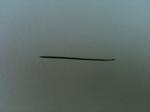
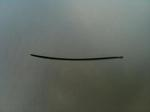
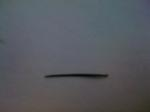
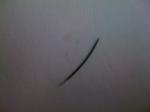
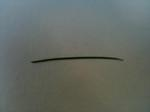
...
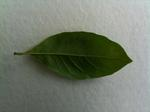
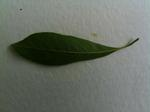
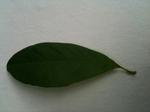
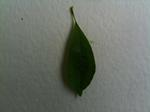
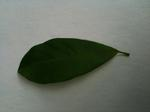

In [39]:
def preview_all():
  for i in range(len(species)):
    preview_images(reference_data[reference_data['species']==species[i]])


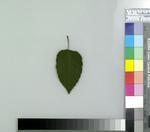
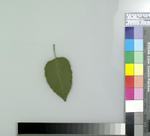
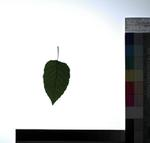
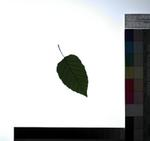
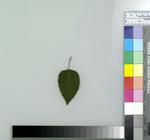
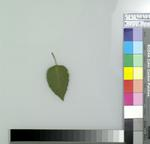
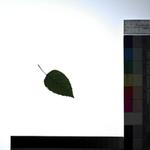
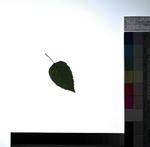

In [46]:
preview_images(lab_plants[lab_plants['species']==species[33]])


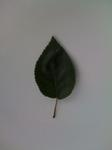
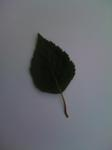
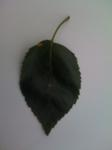
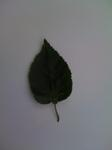
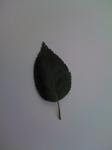
...
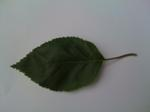
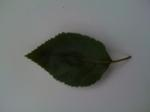
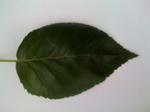
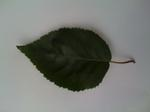
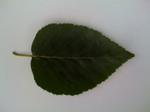

In [47]:
preview_images(field_plants[field_plants['species']==species[33]])

In [0]:
# Make a train-test split
train_data, test_data = lab_plants.random_split(0.8)

In [15]:
# Create the model
model = tc.image_classifier.create(train_data, target='species')

Performing feature extraction on resized images...
Completed    64/37050
Completed   128/37050
Completed   192/37050
Completed   256/37050
Completed   320/37050
Completed   384/37050
Completed   448/37050
Completed   512/37050
Completed   576/37050
Completed   640/37050
Completed   704/37050
Completed   768/37050
Completed   832/37050
Completed   896/37050
Completed   960/37050
Completed  1024/37050
Completed  1088/37050
Completed  1152/37050
Completed  1216/37050
Completed  1280/37050
Completed  1344/37050
Completed  1408/37050
Completed  1472/37050
Completed  1536/37050
Completed  1600/37050
Completed  1664/37050
Completed  1728/37050
Completed  1792/37050
Completed  1856/37050
Completed  1920/37050
Completed  1984/37050
Completed  2048/37050
Completed  2112/37050
Completed  2176/37050
Completed  2240/37050
Completed  2304/37050
Completed  2368/37050
Completed  2432/37050
Completed  2496/37050
Completed  2560/37050
Completed  2624/37050
Completed  2688/37050
Completed  2752/37050
Com

Logistic regression:

--------------------------------------------------------

Number of examples          : 35214

Number of classes           : 185

Number of feature columns   : 1

Number of unpacked features : 2048

Number of coefficients      : 377016

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 1        | NaN       | 54.681242    | 0.008576          | 0.011983            |

| 1         | 6        | 0.000003  | 374.673665   | 0.018317          | 0.018519            |

| 2         | 8        | 1.000000  | 524.637921   | 0.037144          | 0.039216            |

| 3         | 9        | 1.000000  | 618.574721   | 0.121372          | 0.122004            |

| 4         | 10       | 1.000000  | 712.731984   | 0.225706          | 0.206972            |

| 5         | 11       | 1.000000  | 806.962690   | 0.338189          | 0.319717            |

| 6         | 12       | 1.000000  | 899.988165   | 0.409837          | 0.384532            |

| 7         | 13       | 1.000000  | 994.356653   | 0.443460          | 0.407407            |

| 8         | 14       | 1.000000  | 1088.305197  | 0.445987          | 0.403595            |

| 9         | 15       | 1.000000  | 1183.045242  | 0.481172          | 0.437364            |

| 10        | 16       | 1.000000  | 1277.330014  | 0.498864          | 0.457516            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

Completed (Iteration limit reached).

This model may not be optimal. To improve it, consider increasing `max_iterations`.

In [0]:
# Save predictions to an SArray
predictions = model.predict(test_data)

In [17]:
# Evaluate the model and save the results into a dictionary
metrics = model.evaluate(test_data)

Performing feature extraction on resized images...
Completed   64/9244
Completed  128/9244
Completed  192/9244
Completed  256/9244
Completed  320/9244
Completed  384/9244
Completed  448/9244
Completed  512/9244
Completed  576/9244
Completed  640/9244
Completed  704/9244
Completed  768/9244
Completed  832/9244
Completed  896/9244
Completed  960/9244
Completed 1024/9244
Completed 1088/9244
Completed 1152/9244
Completed 1216/9244
Completed 1280/9244
Completed 1344/9244
Completed 1408/9244
Completed 1472/9244
Completed 1536/9244
Completed 1600/9244
Completed 1664/9244
Completed 1728/9244
Completed 1792/9244
Completed 1856/9244
Completed 1920/9244
Completed 1984/9244
Completed 2048/9244
Completed 2112/9244
Completed 2176/9244
Completed 2240/9244
Completed 2304/9244
Completed 2368/9244
Completed 2432/9244
Completed 2496/9244
Completed 2560/9244
Completed 2624/9244
Completed 2688/9244
Completed 2752/9244
Completed 2816/9244
Completed 2880/9244
Completed 2944/9244
Completed 3008/9244
Completed

In [19]:
print(metrics['accuracy'])

0.47349632193855473


In [20]:
print(metrics['confusion_matrix'])

+----------------------+-----------------------+-------+
|     target_label     |    predicted_label    | count |
+----------------------+-----------------------+-------+
|     acer_rubrum      |      acer_negundo     |   2   |
|   acer_platanoides   |     acer_palmatum     |   2   |
|  amelanchier_laevis  | betula_alleghaniensis |   2   |
| acer_pseudoplatanus  |  acer_pseudoplatanus  |   30  |
|  betula_jacqemontii  |     pinus_strobus     |   1   |
| populus_tremuloides  |  crataegus_laevigata  |   1   |
| carpinus_caroliniana |       ilex_opaca      |   1   |
|     pinus_taeda      |    maclura_pomifera   |   1   |
| acer_pseudoplatanus  |   acer_pensylvanicum  |   2   |
|  prunus_virginiana   |       morus_alba      |   1   |
+----------------------+-----------------------+-------+
[2549 rows x 3 columns]
Note: Only the head of the SFrame is printed.
You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.
